# Preprocessing: Realistic Dataset (No Real Visium Reference)

This notebook preprocesses Xenium datasets for tissues without a matched real Visium capture:
breast cancer (Xenium replicate 1, registered to its own post-run H&E image), ovarian cancer,
and lymph node. Pseudo-spot centers are generated from an assumed hexagonal grid (margin, spot
diameter, spot spacing) over each Xenium capture area, rather than from real Visium spot
coordinates.

Structure:
- **Part 1**: Loading functions, datasets
- **Part 2**: Breast Tumor
- **Part 3**: Ovarian Cancer
- **Part 4**: Lymph Node


# Part 1: Loading Functions, Datasets

## Part 1.1: Imports and function loading

In [1]:
import json
from pathlib import Path

import numpy as np

### Functions for registration of Xenium to a post-run H&E image
from companion_functions import get_xenium_to_morphology_transform_from_xenium_morphology_image

import importlib
import pseudo_util as pu
import xenium as xenium_module

importlib.reload(pu)               # reload dependency first
importlib.reload(xenium_module)    # then reload the module that uses it

import logging as log
log.basicConfig(level=log.INFO, format='[%(levelname)s] %(name)s: %(message)s', force=True)


## Part 1.2: Batch download instruction and Paths

One bundle directory per tissue, plus the resulting `Xenium.__init__` `paths` dictionaries:
`breast_paths` (breast), `ovarian_paths` (ovarian), `lymph_paths` (lymph node).

To download breast tumor dataset: 
```
curl -O https://cf.10xgenomics.com/samples/xenium/1.0.1/Xenium_FFPE_Human_Breast_Cancer_Rep1/Xenium_FFPE_Human_Breast_Cancer_Rep1_outs.zip
unzip Xenium_FFPE_Human_Breast_Cancer_Rep1/Xenium_FFPE_Human_Breast_Cancer_Rep1_outs.zip
curl -O https://cf.10xgenomics.com/samples/xenium/1.0.1/Xenium_FFPE_Human_Breast_Cancer_Rep1/Xenium_FFPE_Human_Breast_Cancer_Rep1_he_image.ome.tif
curl -O https://cf.10xgenomics.com/samples/xenium/1.0.1/Xenium_FFPE_Human_Breast_Cancer_Rep1/Xenium_FFPE_Human_Breast_Cancer_Rep1_he_imagealignment.csv
```
Additionally, download the cell type annotation excel offered on the page https://www.10xgenomics.com/products/xenium-in-situ/preview-dataset-human-breast.

To download ovarian cancer dataset: 
```
curl -O https://s3-us-west-2.amazonaws.com/10x.files/samples/xenium/3.0.0/Xenium_Prime_Ovarian_Cancer_FFPE_XRrun/Xenium_Prime_Ovarian_Cancer_FFPE_XRrun_outs.zip
unzip Xenium_Prime_Ovarian_Cancer_FFPE_XRrun_outs.zip 
curl -O https://cf.10xgenomics.com/samples/xenium/3.0.0/Xenium_Prime_Ovarian_Cancer_FFPE_XRrun/Xenium_Prime_Ovarian_Cancer_FFPE_XRrun_gene_groups.csv 
curl -O https://cf.10xgenomics.com/samples/xenium/3.0.0/Xenium_Prime_Ovarian_Cancer_FFPE_XRrun/Xenium_Prime_Ovarian_Cancer_FFPE_XRrun_cell_groups.csv
curl -O https://cf.10xgenomics.com/samples/xenium/3.0.0/Xenium_Prime_Ovarian_Cancer_FFPE_XRrun/Xenium_Prime_Ovarian_Cancer_FFPE_XRrun_he_image.ome.tif
curl -O https://cf.10xgenomics.com/samples/xenium/3.0.0/Xenium_Prime_Ovarian_Cancer_FFPE_XRrun/Xenium_Prime_Ovarian_Cancer_FFPE_XRrun_he_imagealignment.csv
curl -O https://cf.10xgenomics.com/samples/xenium/3.0.0/Xenium_Prime_Ovarian_Cancer_FFPE_XRrun/Xenium_Prime_Ovarian_Cancer_FFPE_XRrun_he_annotated_image.ome.tif
curl -O https://cf.10xgenomics.com/samples/xenium/3.0.0/Xenium_Prime_Ovarian_Cancer_FFPE_XRrun/Xenium_Prime_Ovarian_Cancer_FFPE_XRrun_annotation.geojson
```

To download lymph node dataset: 
```
curl -O https://s3-us-west-2.amazonaws.com/10x.files/samples/xenium/3.0.0/Xenium_Prime_Human_Lymph_Node_Reactive_FFPE/Xenium_Prime_Human_Lymph_Node_Reactive_FFPE_outs.zip
unzip Xenium_Prime_Human_Lymph_Node_Reactive_FFPE_outs.zip
curl -O https://cf.10xgenomics.com/samples/xenium/3.0.0/Xenium_Prime_Human_Lymph_Node_Reactive_FFPE/Xenium_Prime_Human_Lymph_Node_Reactive_FFPE_gene_groups.csv
curl -O https://cf.10xgenomics.com/samples/xenium/3.0.0/Xenium_Prime_Human_Lymph_Node_Reactive_FFPE/Xenium_Prime_Human_Lymph_Node_Reactive_FFPE_cell_types.csv
curl -O https://cf.10xgenomics.com/samples/xenium/3.0.0/Xenium_Prime_Human_Lymph_Node_Reactive_FFPE/Xenium_Prime_Human_Lymph_Node_Reactive_FFPE_he_image.ome.tif
curl -O https://cf.10xgenomics.com/samples/xenium/3.0.0/Xenium_Prime_Human_Lymph_Node_Reactive_FFPE/Xenium_Prime_Human_Lymph_Node_Reactive_FFPE_he_imagealignment.csv
curl -O https://cf.10xgenomics.com/samples/xenium/3.0.0/Xenium_Prime_Human_Lymph_Node_Reactive_FFPE/Xenium_Prime_Human_Lymph_Node_Reactive_FFPE_annotation.geojson
```

In [2]:
path_to_breast_bundle = Path("../../../data/realistic_raw/breast/xenium-rep1/outs")
path_to_xenium_celltype_labels = Path("../../../data/realistic_raw/breast/Cell_Barcode_Type_Matrices.xlsx")
path_to_ovarian_bundle = Path("../../../data/realistic_raw/ovarian")
path_to_lymph_bundle = Path("../../../data/realistic_raw/lymph")


In [3]:
breast_paths = {
    "he_img": path_to_breast_bundle.parent / "Xenium_FFPE_Human_Breast_Cancer_Rep1_he_image.ome.tif",
    "cell_type": path_to_xenium_celltype_labels,
    "cell_info": path_to_breast_bundle / "cells.csv.gz",
    "transcript": path_to_breast_bundle / "transcripts.parquet",
    "cell_count": path_to_breast_bundle / "cell_feature_matrix.h5",
    'morph_img': path_to_breast_bundle / "morphology_mip.ome.tif",
}


In [4]:
ovarian_paths = {
    "he_img": path_to_ovarian_bundle / "Xenium_Prime_Ovarian_Cancer_FFPE_XRrun_he_image.ome.tif",
    "cell_type": path_to_ovarian_bundle / "Xenium_Prime_Ovarian_Cancer_FFPE_XRrun_cell_groups.csv",
    "cell_info": path_to_ovarian_bundle / "cells.csv.gz",
    "transcript": path_to_ovarian_bundle / "transcripts.parquet",
    "cell_count": path_to_ovarian_bundle / "cell_feature_matrix.h5",
    'morph_img': path_to_ovarian_bundle / "morphology.ome.tif",
}


In [5]:
lymph_paths = {
    "he_img": path_to_lymph_bundle / "Xenium_Prime_Human_Lymph_Node_Reactive_FFPE_he_image.ome.tif",
    "cell_type": path_to_lymph_bundle / "Xenium_Prime_Human_Lymph_Node_Reactive_FFPE_cell_types.csv",
    "cell_info": path_to_lymph_bundle / "cells.csv.gz",
    "transcript": path_to_lymph_bundle / "transcripts.parquet",
    "cell_count": path_to_lymph_bundle / "cell_feature_matrix.h5",
    'morph_img': path_to_lymph_bundle / "morphology.ome.tif",
}


# Part 2: Breast Tumor

Uses Xenium replicate 1's raw data, registered to its own post-run H&E image (rather than to
Visium, as in `preprocess_realistic_validation.ipynb`). This dataset is not filtered to a gene
panel subset before analysis.


## Part 2.1: Align morphology to the post-run H&E image

In [6]:
xenium_morphology_to_post_he_transformation = np.linalg.inv(
    np.loadtxt(path_to_breast_bundle.parent / "Xenium_FFPE_Human_Breast_Cancer_Rep1_he_imagealignment.csv", delimiter=",")
)

xenium_to_morphology_transformation = get_xenium_to_morphology_transform_from_xenium_morphology_image(
        path_to_breast_bundle / "morphology_mip.ome.tif", 0
    )

breast_affline = xenium_morphology_to_post_he_transformation @ xenium_to_morphology_transformation


## Part 2.2: Construct the Xenium object

Construction performs QC filtering of transcripts and plots the alignment of detected transcripts against the H&E image.

[INFO] xenium: Successfully extracted H&E meta: 0.36378800370496256 um/pixel
[INFO] xenium: Total transcript count: 42638083...
[INFO] xenium: After filtering for QC and unassigned cell id, total transcript counts : 32143179...
[INFO] xenium: Locations converted.  Now plotting...


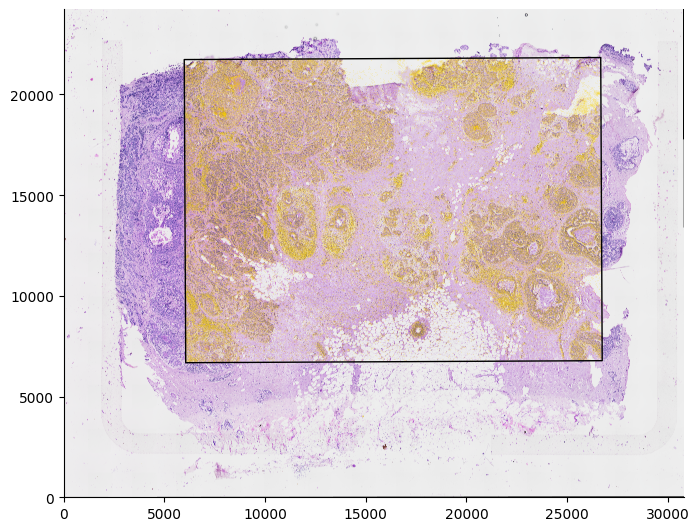

In [7]:
breast_xenium = xenium_module.Xenium(paths = breast_paths, afline_mat = breast_affline, cell_type_sheet_name = "Xenium R1 Fig1-5 (supervised)")


## Part 2.3: Generate pseudo-spot polygons from an assumed grid

[INFO] xenium: Generated 880 spots ....


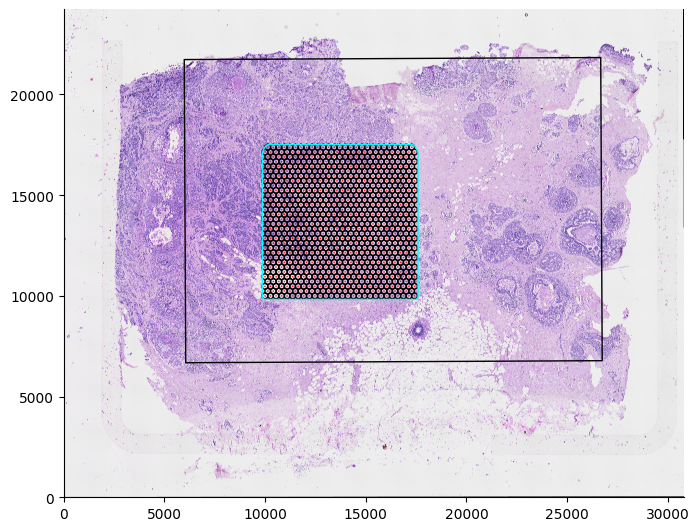

In [8]:
# small
breast_xenium.polygons_from_assumption(margin_set = [10000, 17500, 10000, 17500])
# large
# breast_xenium.polygons_from_assumption(margin = 300)


## Part 2.4: Simulate and save pseudo spots

In [9]:
breast_xenium.generate_pseudo_spot(radius = 27.5)


Processing transcripts: 100%|██████████| 322/322 [00:15<00:00, 20.62batch/s]
[INFO] xenium: Total transcript 32143179, in capture transcript 5849808,in visium disc transcript 1559945


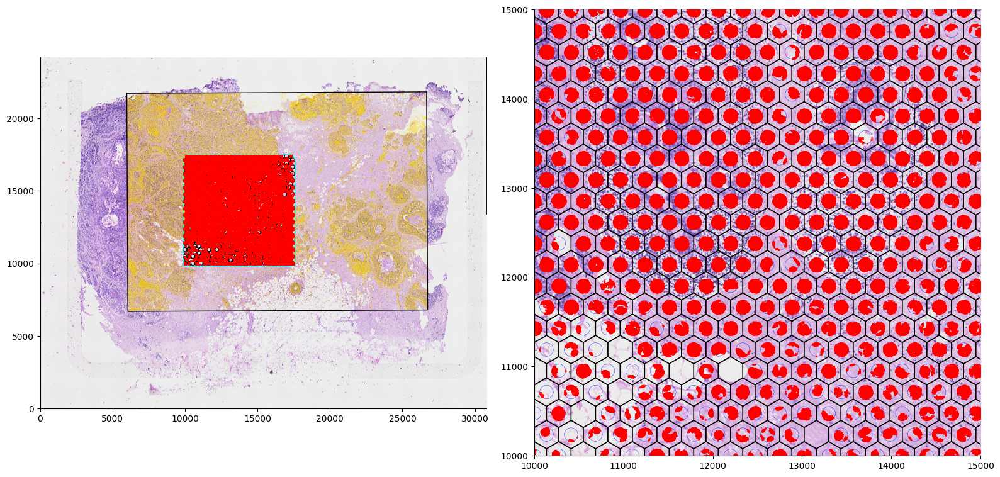

In [10]:
breast_xenium.pseudo_visualize(zoom_min = 10000, zoom_max = 15000)


Additional one-off QC figure (not part of `Xenium.pseudo_visualize()`): a single zoomed-in view
with, bottom to top, the H&E image, cell segmentation boundaries (`cell_boundaries.parquet`),
pseudo-spot polygons, and transcripts colored by whether they fall within a spot's circular
capture boundary (gold = within, grey = outside). Fill in the zoom window below before running.

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.patches import Circle

# Zoom window, in the same H&E pixel coordinate system as `pseudo_visualize`'s zoom_min/zoom_max.
# TODO: fill these in.
zoom_x_min, zoom_x_max = None, None
zoom_y_min, zoom_y_max = None, None

# Cell segmentation boundaries (10x Xenium `cell_boundaries.parquet`: cell_id, vertex_x, vertex_y
# in raw Xenium coordinates). If the zoom window is set, restrict to cells whose centroid falls
# inside it before transforming, since the full-tissue boundary set is large.
cell_boundaries = pd.read_parquet(path_to_breast_bundle / "cell_boundaries.parquet")
cell_boundaries["cell_id"] = cell_boundaries["cell_id"].apply(
    lambda x: x.decode("utf-8", "ignore") if isinstance(x, (bytes, bytearray)) else x
)

if zoom_x_min is not None and zoom_y_min is not None:
    cell_info = breast_xenium.cell_info
    zoomed_cell_ids = cell_info.index[
        cell_info["x_transformed"].between(zoom_x_min, zoom_x_max)
        & cell_info["y_transformed"].between(zoom_y_min, zoom_y_max)
    ]
    cell_boundaries = cell_boundaries[cell_boundaries["cell_id"].isin(zoomed_cell_ids)]

cell_boundaries[["x_transformed", "y_transformed"]] = pu.transform_coordinates(
    cell_boundaries[["vertex_x", "vertex_y"]].to_numpy(),
    breast_affline,
)
cell_boundary_polygons = [
    poly[["x_transformed", "y_transformed"]].to_numpy()
    for _, poly in cell_boundaries.groupby("cell_id", sort=False)
]

fig, ax = plt.subplots(figsize=(8, 8))

# Layer 1: H&E image
ax.imshow(breast_xenium.he_img, origin="lower")

# Layer 2: cell boundaries
pu.plot_polygons(
    cell_boundary_polygons,
    ax=ax,
    facecolor=(0, 0, 0, 0),
    edgecolor="magenta",
    linewidth=0.4,
)

# Layer 3: pseudo-spot polygons -- space-filling hexagon grid plus each spot's circular capture boundary
pu.plot_polygons(
    breast_xenium.hexagon_polygons,
    ax=ax,
    facecolor=(0, 0, 0, 0),
    edgecolor="black",
    linewidth=1,
)
for x, y in breast_xenium.pseudo_meta[["x_transformed", "y_transformed"]].to_numpy():
    ax.add_patch(Circle((x, y), radius=breast_xenium.radius, edgecolor="cyan", facecolor="none", linewidth=0.5))

# Layer 4: transcripts -- gold if within a spot's circular capture boundary, grey otherwise
transcripts = breast_xenium.transcripts
ax.scatter(
    transcripts.loc[~transcripts["assigned"], "x_transformed"],
    transcripts.loc[~transcripts["assigned"], "y_transformed"],
    color="grey", s=0.8, linewidths=0, label="out of circular boundary",
)
ax.scatter(
    transcripts.loc[transcripts["assigned"], "x_transformed"],
    transcripts.loc[transcripts["assigned"], "y_transformed"],
    color="gold", s=0.8, linewidths=0, label="within circular boundary",
)

ax.set_xlim(zoom_x_min, zoom_x_max)
ax.set_ylim(zoom_y_min, zoom_y_max)
ax.set_xlabel("x")
ax.set_ylabel("y")
ax.spines.right.set_visible(False)
ax.spines.top.set_visible(False)
ax.yaxis.set_ticks_position("left")
ax.xaxis.set_ticks_position("bottom")
ax.set_aspect("equal", adjustable="box")
ax.legend(markerscale=10, loc="upper right")

plt.tight_layout()
plt.show()

In [11]:
breast_xenium.save_data(path = "../../../data/realistic_preprocessed/breast", cell_type_id_name = "Barcode", cell_type_cluster_name = "Cluster")


[INFO] xenium: Selected 870 out of 870 spots...
[INFO] xenium: selected total 13902 cells...
[INFO] xenium: Finished writing cell spot proportion...
[INFO] xenium: Finished writing cell-gene dropout fraction...
[INFO] xenium: Finished saving training cell meta and count information...
[INFO] xenium: Finished saving pseudo meta and count information


# Part 3: Ovarian Cancer

## Part 3.1: Align morphology to the post-run H&E image

In [12]:
xenium_to_morphology_transformation = get_xenium_to_morphology_transform_from_xenium_morphology_image(
        path_to_ovarian_bundle / "morphology.ome.tif", 0
    )
morphology_to_post_he_transformation = np.linalg.inv(
    np.loadtxt(path_to_ovarian_bundle / "Xenium_Prime_Ovarian_Cancer_FFPE_XRrun_he_imagealignment.csv", delimiter=",")
)

ovarian_affline = morphology_to_post_he_transformation @ xenium_to_morphology_transformation


## Part 3.2: Load the gene panel

We also need to collect the genes actually on the gene panel and filter out those used for negative controls.

In [13]:
with open(path_to_ovarian_bundle / "gene_panel.json", "r") as f:
    data = json.load(f)

genes = [
        t["type"]["data"]["name"]
        for t in data["payload"]["targets"]
        if t.get("type", {}).get("descriptor") == "gene"
    ]
genes = set(genes)
print(f"Total json file contain {len(genes)} genes...")


Total json file contain 5101 genes...


## Part 3.3: Construct the Xenium object

Construction performs QC filtering of transcripts and plots the alignment of detected transcripts against the H&E image.

[WARNING] xenium: X ratio  0.27381747951119634 and Y ratio 0.2738199162532739 mismatch.
[INFO] xenium: Successfully extracted H&E meta: 0.27381747951119634 um/pixel
[INFO] xenium: Total transcript count: 147706750...
[INFO] xenium: After filtering for QC and unassigned cell id, total transcript counts : 115828096...
[INFO] xenium: After filtering for only selected genes, total transcript counts : 106483418...
[INFO] xenium: Locations converted.  Now plotting...


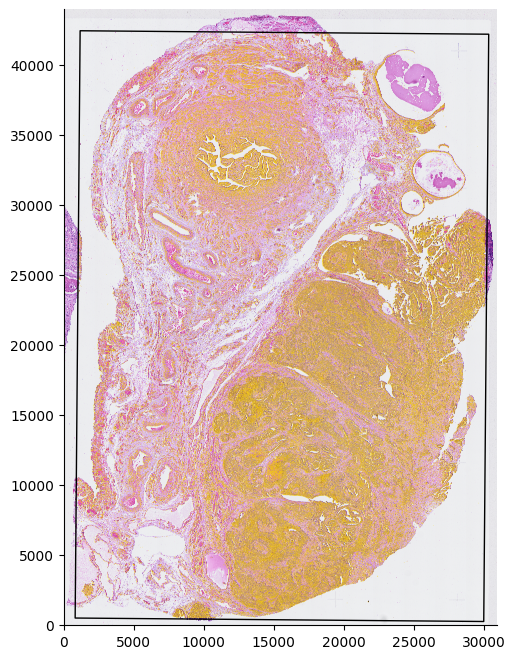

In [14]:
ovarian_xenium = xenium_module.Xenium(paths = ovarian_paths, afline_mat = ovarian_affline, selected_genes = genes)


## Part 3.4: Generate pseudo-spot polygons from an assumed grid

[INFO] xenium: Generated 672 spots ....


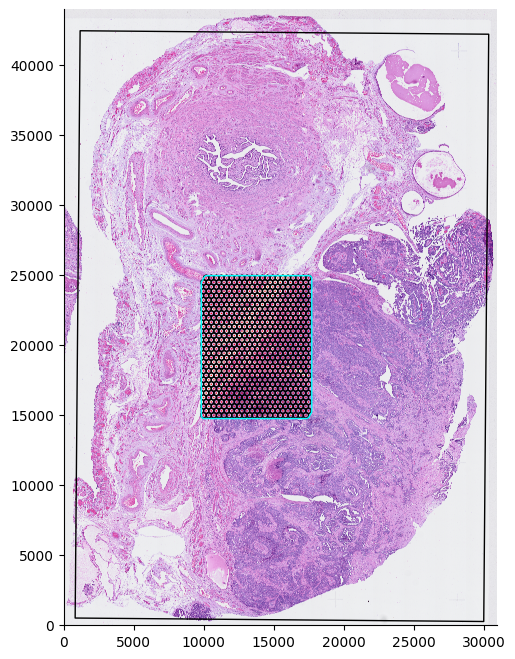

In [15]:
ovarian_xenium.polygons_from_assumption(margin_set = [10000, 17500, 15000, 25000])


## Part 3.5: Simulate and save pseudo spots

In [16]:
ovarian_xenium.generate_pseudo_spot(radius = 27.5)


Processing transcripts: 100%|██████████| 1065/1065 [00:47<00:00, 22.42batch/s]
[INFO] xenium: Total transcript 106483418, in capture transcript 9833024,in visium disc transcript 2593411


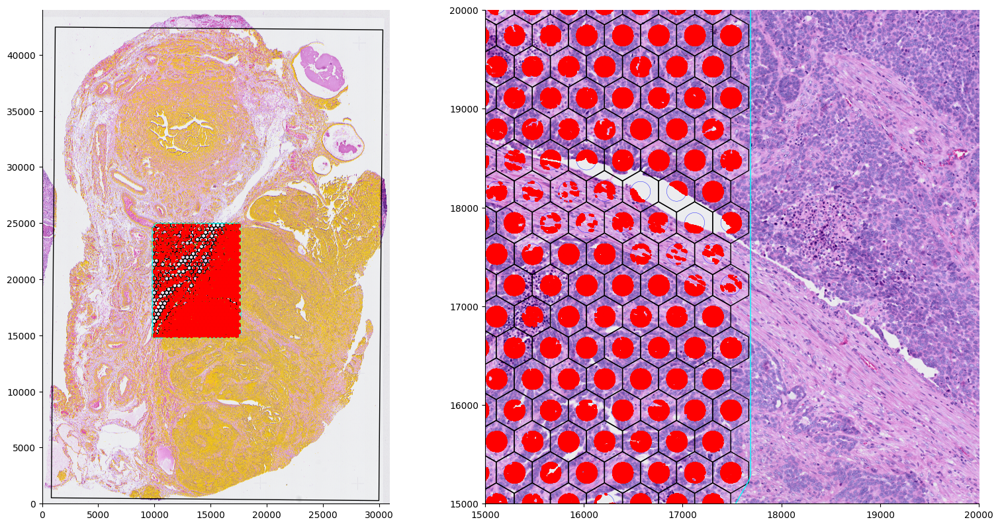

In [17]:
ovarian_xenium.pseudo_visualize(zoom_min = 15000, zoom_max = 20000)


In [18]:
ovarian_xenium.save_data(path = "../../../data/realistic_preprocessed/ovarian", cell_type_id_name = "cell_id", cell_type_cluster_name = "group")


[INFO] xenium: Selected 627 out of 627 spots...
[INFO] xenium: selected total 12284 cells...
[INFO] xenium: Finished writing cell spot proportion...
[INFO] xenium: Finished writing cell-gene dropout fraction...
[INFO] xenium: Finished saving training cell meta and count information...
[INFO] xenium: Finished saving pseudo meta and count information


# Part 4: Lymph Node

## Part 4.1: Align morphology to the post-run H&E image

In [19]:
xenium_to_morphology_transformation = get_xenium_to_morphology_transform_from_xenium_morphology_image(
        path_to_lymph_bundle / "morphology.ome.tif", 0
    )
morphology_to_post_he_transformation = np.linalg.inv(
    np.loadtxt(path_to_lymph_bundle / "Xenium_Prime_Human_Lymph_Node_Reactive_FFPE_he_imagealignment.csv", delimiter=",")
)

lymph_affline = morphology_to_post_he_transformation @ xenium_to_morphology_transformation


## Part 4.2: Load the gene panel

In [20]:
with open(path_to_lymph_bundle / "gene_panel.json", "r") as f:
    data = json.load(f)

genes = [
        t["type"]["data"]["name"]
        for t in data["payload"]["targets"]
        if t.get("type", {}).get("descriptor") == "gene"
    ]
genes = set(genes)
print(f"Total json file contain {len(genes)} genes...")


Total json file contain 4624 genes...


## Part 4.3: Construct the Xenium object

Construction performs QC filtering of transcripts and plots the alignment of detected transcripts against the H&E image.

[WARNING] xenium: X ratio  0.2737726437011389 and Y ratio 0.2737751171216795 mismatch.
[INFO] xenium: Successfully extracted H&E meta: 0.2737726437011389 um/pixel
[INFO] xenium: Total transcript count: 232650139...
[INFO] xenium: After filtering for QC and unassigned cell id, total transcript counts : 191101549...
[INFO] xenium: After filtering for only selected genes, total transcript counts : 191004473...
[INFO] xenium: Locations converted.  Now plotting...


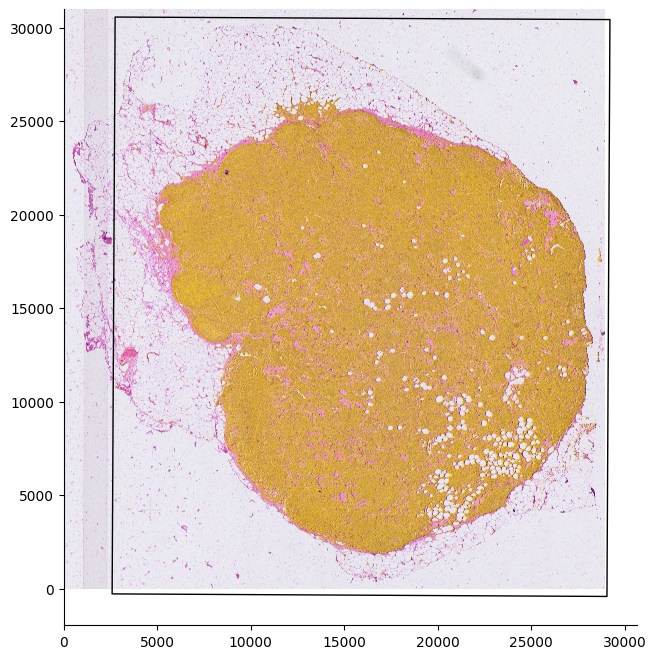

In [21]:
lymph_xenium = xenium_module.Xenium(paths = lymph_paths, afline_mat = lymph_affline, selected_genes = genes)


## Part 4.4: Generate pseudo-spot polygons from an assumed grid

[INFO] xenium: Generated 504 spots ....


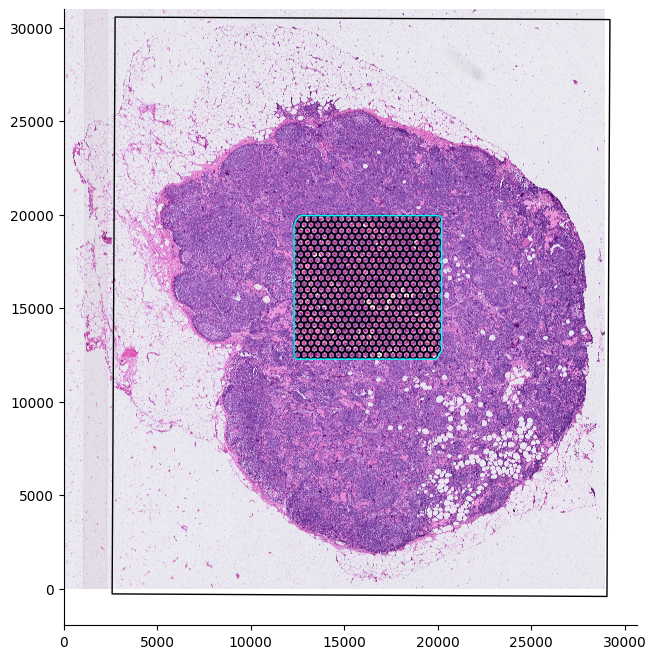

In [22]:
lymph_xenium.polygons_from_assumption(margin_set = [12500, 20000, 12500, 20000])


## Part 4.5: Simulate and save pseudo spots

Processing transcripts: 100%|██████████| 1911/1911 [01:29<00:00, 21.31batch/s]
[INFO] xenium: Total transcript 191004473, in capture transcript 28209078,in visium disc transcript 7467881


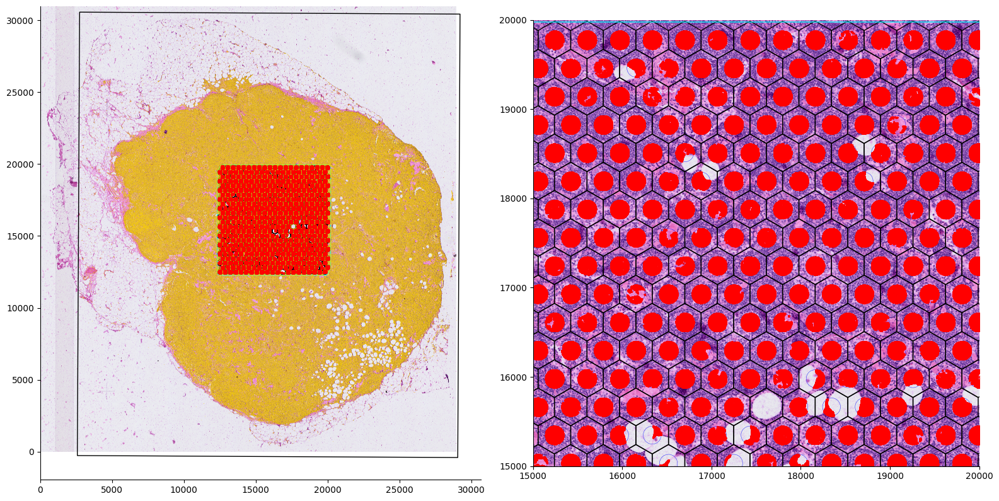

In [23]:
lymph_xenium.generate_pseudo_spot(radius = 27.5)
lymph_xenium.pseudo_visualize(zoom_min = 15000, zoom_max = 20000)


In [24]:
lymph_xenium.save_data(path = "../../../data/realistic_preprocessed/lymph", cell_type_id_name = "cell_id", cell_type_cluster_name = "group")


[INFO] xenium: Selected 503 out of 503 spots...
[INFO] xenium: selected total 34539 cells...
[INFO] xenium: Finished writing cell spot proportion...
[INFO] xenium: Finished writing cell-gene dropout fraction...
[INFO] xenium: Finished saving training cell meta and count information...
[INFO] xenium: Finished saving pseudo meta and count information
